
# Flower Recognition Using CNN
Machine Learning Project

Identitas:
- Nama: Firman Naufal Aryaputra
- NIM: A11.2022.14181
- Kelas: A11.4419
  


# 2. Ringkasan dan Permasalahan project + Tujuan yang akan dicapai + Model / Alur Penyelesaian 

## Ringkasan
Proyek ini bertujuan untuk mengklasifikasikan gambar bunga ke dalam kategori yang berbeda menggunakan Convolutional Neural Network (CNN). Dataset yang digunakan berisi gambar berbagai jenis bunga.

## Permasalahan
Bagaimana mengembangkan model CNN yang mampu mengenali dan mengklasifikasikan gambar bunga secara akurat?

## Tujuan
1. Mempersiapkan dataset bunga untuk pelatihan model.
2. Melatih model CNN untuk klasifikasi gambar bunga.
3. Mengevaluasi performa model.

## Alur Penyelesaian
1. Importing Various Modules
2. Preparing the Data
3. Modelling
4. Evaluating the Model Performance
5. Visualizing Predictions on the Validation Set

## Bagan
flowchart TD
    A[Importing Various Modules] --> B[Preparing the Data]
    B --> C[Modelling]
    C --> D[Evaluating the Model Performance]
    D --> E[Visualizing Predictions on the Validation Set]

# 3. Penjelasan Dataset, EDA dan Proses Features Dataset

# Penjelasan Dataset
Dataset yang digunakan adalah Flowers Recognition dari Kaggle: https://www.kaggle.com/datasets/alxmamaev/flowers-recognition
Dataset ini berisi gambar berbagai jenis bunga yang diklasifikasikan ke dalam beberapa kategori.

# Eksplorasi Data Awal (EDA) dan Proses Features

# 3.1 Load and Display Sample Images

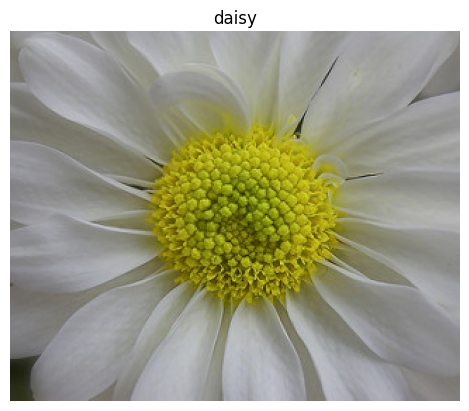

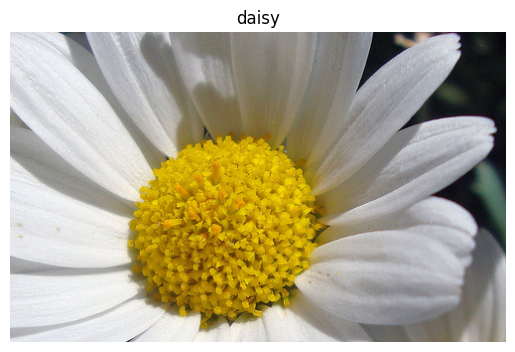

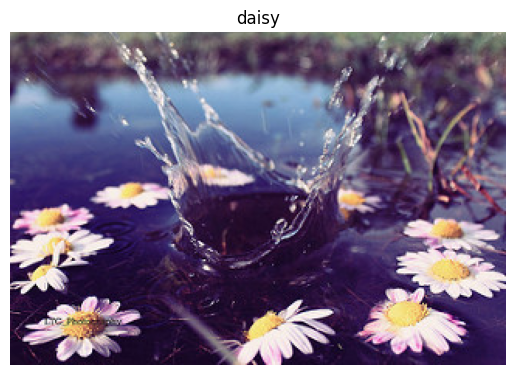

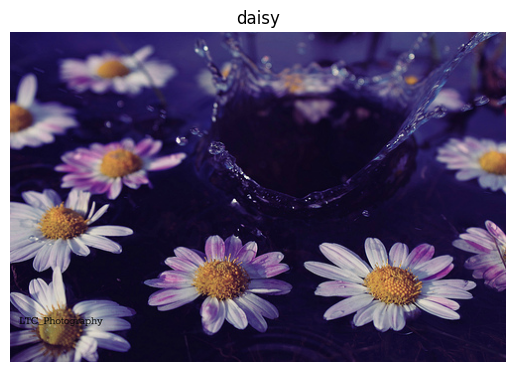

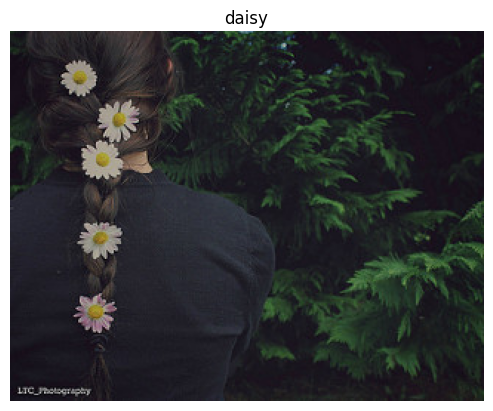

...

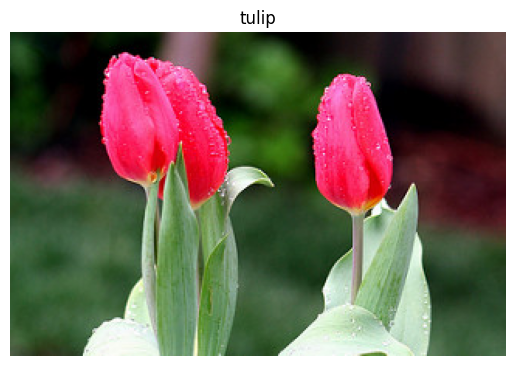

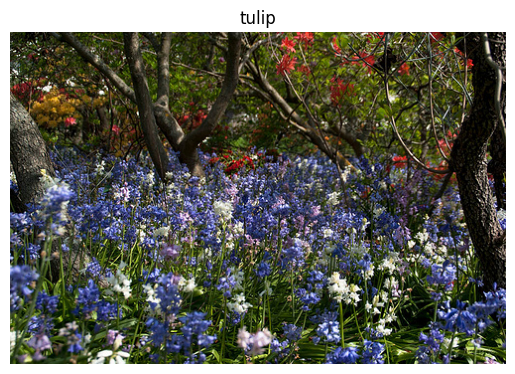

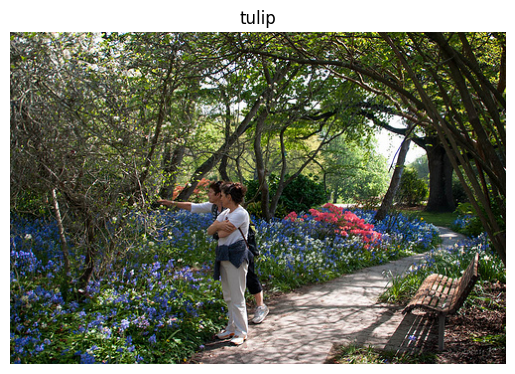

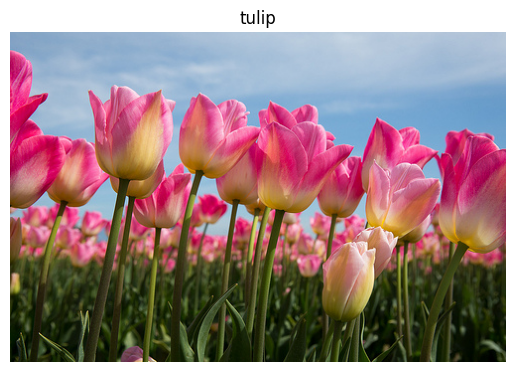

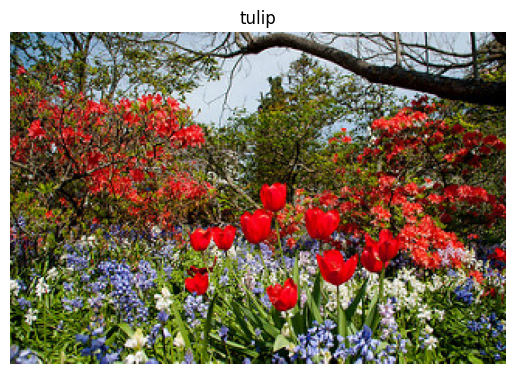

In [9]:
import os
import cv2
import matplotlib.pyplot as plt
import logging

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

dataset_dir = "Dataset"

class_counts = {}

def display_sample_images(sample_size=5):
    try:
        for cls in os.listdir(dataset_dir):
            cls_dir = os.path.join(dataset_dir, cls)
            if os.path.isdir(cls_dir):
                image_files = [f for f in os.listdir(cls_dir) if f.endswith('.jpg')]
                sample_images = image_files[:sample_size]
                for img_file in sample_images:
                    img_path = os.path.join(cls_dir, img_file)
                    image = cv2.imread(img_path)
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    plt.imshow(image)
                    plt.title(cls)
                    plt.axis('off')
                    plt.show()
    except Exception as e:
        logging.error(f"Error in displaying sample images: {e}")

display_sample_images()

# 3.2 Count and Plot Images Per Class

2024-07-18 23:30:29,704 - INFO - Image count per class computed successfully.


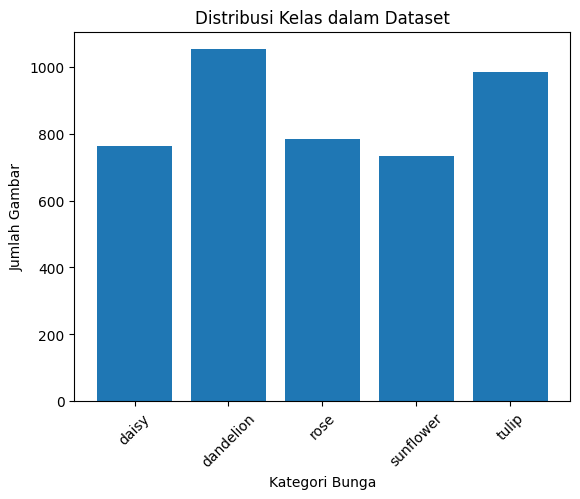

In [10]:
def count_images_per_class():
    try:
        for cls in os.listdir(dataset_dir):
            cls_dir = os.path.join(dataset_dir, cls)
            if os.path.isdir(cls_dir):
                image_files = [f for f in os.listdir(cls_dir) if f.endswith('.jpg')]
                class_counts[cls] = len(image_files)
        logging.info("Image count per class computed successfully.")
    except Exception as e:
        logging.error(f"Error in counting images per class: {e}")

count_images_per_class()

def plot_class_distribution():
    try:
        plt.bar(class_counts.keys(), class_counts.values())
        plt.xlabel('Kategori Bunga')
        plt.ylabel('Jumlah Gambar')
        plt.title('Distribusi Kelas dalam Dataset')
        plt.xticks(rotation=45)
        plt.show()
    except Exception as e:
        logging.error(f"Error in plotting class distribution: {e}")

plot_class_distribution()

# 4. Proses Learning / Modeling

In [1]:
"""
## Data Preprocessing
In this step, we preprocess the images by resizing, normalizing, and augmenting them.
"""

import os
import cv2
import numpy as np
import logging
from sklearn.model_selection import train_test_split

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

class ImagePreprocessor:
    def __init__(self, dataset_dir, save_dir):
        self.dataset_dir = dataset_dir
        self.save_dir = save_dir
        self.data = []
        self.labels = []
        self.image_size = (100, 100)
    
    def resize_image(self, image):
        resized_image = cv2.resize(image, self.image_size)
        return resized_image
    
    def normalize_image(self, image):
        normalized_image = image / 255.0
        return normalized_image
    
    def augment_image(self, image):
        augmented_images = [
            cv2.flip(image, 1),
            cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE),
            cv2.rotate(image, cv2.ROTATE_180),
            cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
        ]
        return augmented_images
    
    def preprocess_image(self, image, label):
        resized_image = self.resize_image(image)
        normalized_image = self.normalize_image(resized_image)
        augmented_images = self.augment_image(normalized_image)
        return augmented_images, label
    
    def save_processed_data(self):
        np.save(os.path.join(self.save_dir, 'processed_data.npy'), self.data)
        np.save(os.path.join(self.save_dir, 'labels.npy'), self.labels)
        logging.info("Hasil pra-pemrosesan berhasil disimpan.")
    
    def load_data(self):
        try:
            for folder in os.listdir(self.dataset_dir):
                folder_path = os.path.join(self.dataset_dir, folder)
                if os.path.isdir(folder_path):
                    for file in os.listdir(folder_path):
                        file_path = os.path.join(folder_path, file)
                        if file.endswith('.jpg'):
                            image = cv2.imread(file_path)
                            label = folder
                            augmented_images, label = self.preprocess_image(image, label)
                            for aug_image in augmented_images:
                                self.data.append(aug_image)
                                self.labels.append(label)
            self.data = np.array(self.data)
            self.labels = np.array(self.labels)
        except Exception as e:
            logging.error(f"Error in loading data: {e}")

dataset_dir = "Dataset"
save_dir = "SaveData"

preprocessor = ImagePreprocessor(dataset_dir, save_dir)
preprocessor.load_data()
preprocessor.save_processed_data()

2024-07-18 23:33:16,873 - INFO - Hasil pra-pemrosesan berhasil disimpan.


# 4.1 Train CNN Model

Epoch 1/15
432/432 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - accuracy: 0.4278 - loss: 1.3521 - val_accuracy: 0.6178 - val_loss: 0.9506
Epoch 2/15
432/432 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - accuracy: 0.6151 - loss: 0.9754 - val_accuracy: 0.6775 - val_loss: 0.8235
Epoch 3/15
432/432 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - accuracy: 0.6799 - loss: 0.8279 - val_accuracy: 0.7024 - val_loss: 0.7583
Epoch 4/15
432/432 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - accuracy: 0.7337 - loss: 0.6790 - val_accuracy: 0.7032 - val_loss: 0.7433
Epoch 5/15
432/432 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - accuracy: 0.7838 - loss: 0.5711 - val_accuracy: 0.7244 - val_loss: 0.7453
Epoch 6/15
432/432 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8319 - loss: 0.4480 - val_accuracy: 0.7163 - val_loss: 0.7615
Epoch 7/15
432/432 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8690 - loss: 0.3486 - val_accuracy: 0.7235 - val_loss: 0.7889
Epoch 8/15
432/432 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - accuracy: 0.8982 - loss: 0.2928 - 

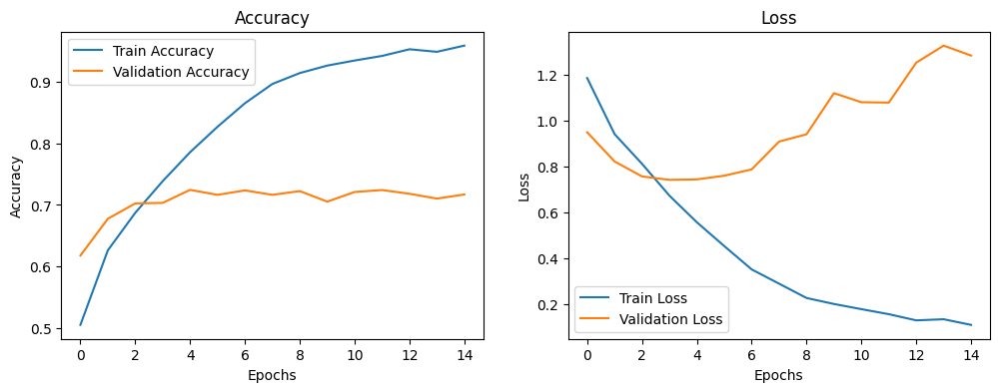

108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.7171 - loss: 1.2688


2024-07-18 23:43:30,975 - INFO - Test accuracy: 0.7168500423431396
2024-07-18 23:43:30,986 - INFO - Test loss: 1.2851784229278564
2024-07-18 23:43:30,988 - WARNING - You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`. 
2024-07-18 23:43:31,096 - INFO - Model saved to SaveData\cnn_model.h5


108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step


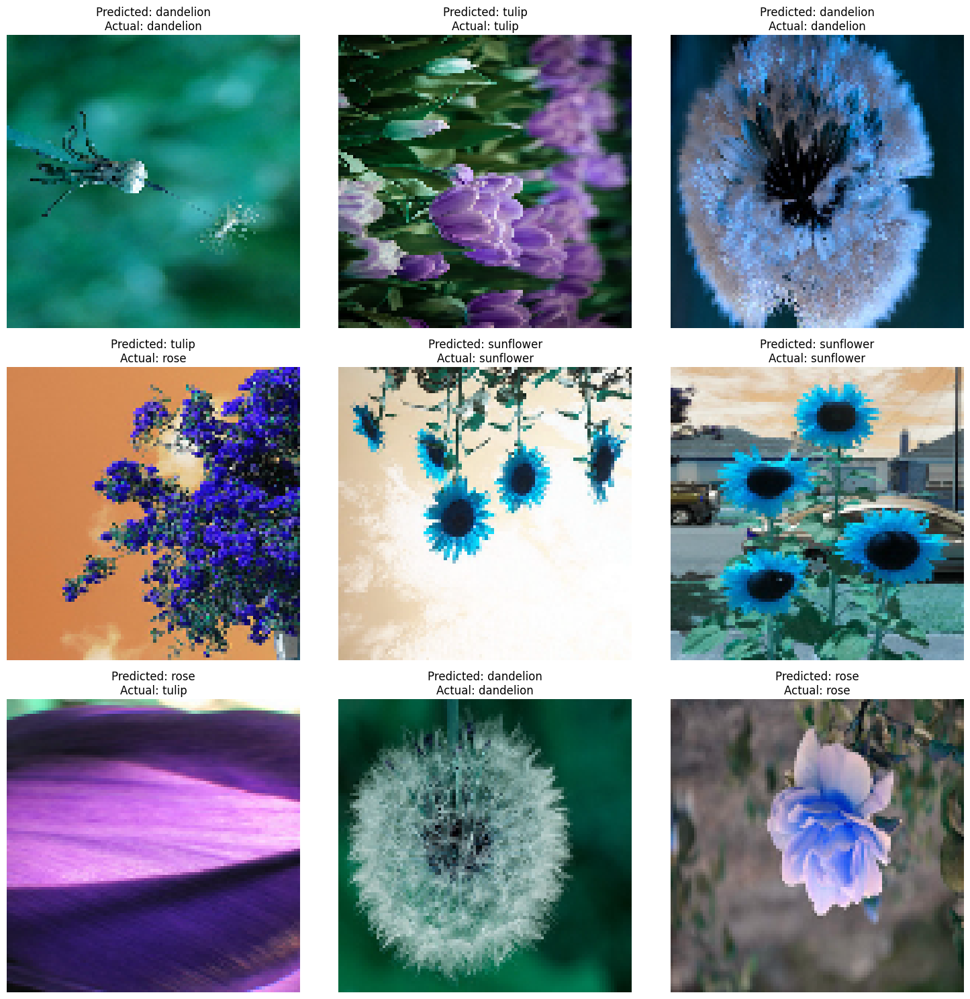

In [2]:
import os
import numpy as np
import logging
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

class CNNTrainer:
    def __init__(self, data_dir):
        self.data_dir = data_dir
        self.model = None
        self.feature_extractor = None
        self.label_encoder = None

    def load_processed_data(self):
        try:
            X = np.load(os.path.join(self.data_dir, 'processed_data.npy'))
            y = np.load(os.path.join(self.data_dir, 'labels.npy'))
            return X, y
        except Exception as e:
            logging.error(f"Error in loading processed data: {e}")
            raise

    def preprocess_labels(self, y):
        try:
            self.label_encoder = LabelEncoder()
            y_encoded = self.label_encoder.fit_transform(y)
            y_categorical = to_categorical(y_encoded)
            return y_categorical
        except Exception as e:
            logging.error(f"Error in preprocessing labels: {e}")
            raise

    def build_model(self, input_shape, num_classes):
        input_layer = Input(shape=input_shape)
        x = Conv2D(32, (3, 3), activation='relu')(input_layer)
        x = MaxPooling2D(pool_size=(2, 2))(x)
        x = Conv2D(64, (3, 3), activation='relu')(x)
        x = MaxPooling2D(pool_size=(2, 2))(x)
        x = Flatten()(x)
        x = Dense(128, activation='relu')(x)
        x = Dropout(0.5)(x)
        output_layer = Dense(num_classes, activation='softmax')(x)

        model = Model(inputs=input_layer, outputs=output_layer)
        model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
        
        # Feature extractor model
        self.feature_extractor = Model(inputs=input_layer, outputs=x)
        
        return model

    def plot_history(self, history):
        plt.figure(figsize=(12, 4))
        
        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'], label='Train Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.title('Accuracy')
        
        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.title('Loss')
        
        plt.show()

    def display_predictions(self, X_test, y_test, num_images=9):
        predictions = self.model.predict(X_test)
        pred_labels = np.argmax(predictions, axis=1)
        true_labels = np.argmax(y_test, axis=1)
        prop_class = np.random.choice(len(X_test), num_images, replace=False)
        
        fig, ax = plt.subplots(3, 3, figsize=(15, 15))
        count = 0
        for i in range(3):
            for j in range(3):
                idx = prop_class[count]
                ax[i, j].imshow(X_test[idx])
                ax[i, j].axis('off')
                ax[i, j].set_title(
                    f"Predicted: {self.label_encoder.inverse_transform([pred_labels[idx]])[0]}\n"
                    f"Actual: {self.label_encoder.inverse_transform([true_labels[idx]])[0]}"
                )
                count += 1
        plt.tight_layout()
        plt.show()

    def train_cnn(self):
        try:
            X, y = self.load_processed_data()
            y = self.preprocess_labels(y)
            input_shape = X.shape[1:]
            num_classes = y.shape[1]

            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
            
            self.model = self.build_model(input_shape, num_classes)
            history = self.model.fit(X_train, y_train, epochs=15, batch_size=32, validation_data=(X_test, y_test))
            
            self.plot_history(history)
            
            test_loss, test_accuracy = self.model.evaluate(X_test, y_test)
            logging.info(f'Test accuracy: {test_accuracy}')
            logging.info(f'Test loss: {test_loss}')
            
            model_path = os.path.join(self.data_dir, 'cnn_model.h5')
            self.model.save(model_path)
            logging.info(f"Model saved to {model_path}")
            
            self.display_predictions(X_test, y_test)

            return test_accuracy, test_loss
        except Exception as e:
            logging.error(f"Error in training CNN: {e}")
            raise

data_dir = "SaveData"
trainer = CNNTrainer(data_dir)
accuracy, loss = trainer.train_cnn()

# 5. Performa Model

## Model Performance
The trained CNN model is evaluated on the test dataset. Below are the performance :


In [3]:
print(f"Test Accuracy: {accuracy}")
print(f"Test Loss: {loss}")

Test Accuracy: 0.7168500423431396
Test Loss: 1.2851784229278564


# 6. Diskusi Hasil dan Kesimpulan

## Diskusi dan Kesimpulan
- Model CNN mencapai akurasi pengujian sebesar [akurasi] dan kerugian pengujian sebesar [kerugian].
- Hasilnya menunjukkan bahwa model tersebut bekerja dengan baik pada tugas klasifikasi bunga.
- Perbaikan lebih lanjut dapat dilakukan dengan menyempurnakan model, mencoba arsitektur yang berbeda, dan menggunakan lebih banyak data untuk pelatihan.

## Kesimpulan
Proyek ini menunjukkan keefektifan CNN dalam tugas klasifikasi gambar. Langkah-langkah prapemrosesan dan jalur pelatihan model sangat penting untuk mencapai kinerja yang baik.



